# Assignement 2

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from sklearn.feature_extraction.text import CountVectorizer
import matplotlib.patches as mpatches

In [2]:
%matplotlib inline
plt.rcParams['figure.figsize'] = [12, 10]
vectorizer = CountVectorizer()

In [3]:
%%time
data = pd.read_csv('Crimes_-_2001_to_present.csv')

CPU times: user 51 s, sys: 6.74 s, total: 57.7 s
Wall time: 1min


After the data is read in the first thing I wanted to do was see exactly how much there was and what it looked like

In [4]:
data.shape

(6751007, 22)

In [5]:
data.head()

,ID,Case Number,Date,Block,IUCR,Primary Type,Description,Location Description,Arrest,Domestic,...,Ward,Community Area,FBI Code,X Coordinate,Y Coordinate,Year,Updated On,Latitude,Longitude,Location
0,10000092,HY189866,03/18/2015 07:44:00 PM,047XX W OHIO ST,041A,BATTERY,AGGRAVATED: HANDGUN,STREET,False,False,...,28.0,25.0,04B,1144606.0,1903566.0,2015,02/10/2018 03:50:01 PM,41.891399,-87.744385,"(41.891398861, -87.744384567)"
1,10000094,HY190059,03/18/2015 11:00:00 PM,066XX S MARSHFIELD AVE,4625,OTHER OFFENSE,PAROLE VIOLATION,STREET,True,False,...,15.0,67.0,26,1166468.0,1860715.0,2015,02/10/2018 03:50:01 PM,41.773372,-87.665319,"(41.773371528, -87.665319468)"
2,10000095,HY190052,03/18/2015 10:45:00 PM,044XX S LAKE PARK AVE,0486,BATTERY,DOMESTIC BATTERY SIMPLE,APARTMENT,False,True,...,4.0,39.0,08B,1185075.0,1875622.0,2015,02/10/2018 03:50:01 PM,41.813861,-87.596643,"(41.81386068, -87.596642837)"
3,10000096,HY190054,03/18/2015 10:30:00 PM,051XX S MICHIGAN AVE,0460,BATTERY,SIMPLE,APARTMENT,False,False,...,3.0,40.0,08B,1178033.0,1870804.0,2015,02/10/2018 03:50:01 PM,41.800802,-87.622619,"(41.800802415, -87.622619343)"
4,10000097,HY189976,03/18/2015 09:00:00 PM,047XX W ADAMS ST,031A,ROBBERY,ARMED: HANDGUN,SIDEWALK,False,False,...,28.0,25.0,03,1144920.0,1898709.0,2015,02/10/2018 03:50:01 PM,41.878065,-87.743354,"(41.878064761, -87.743354013)"


In [6]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6751007 entries, 0 to 6751006
Data columns (total 22 columns):
ID                      int64
Case Number             object
Date                    object
Block                   object
IUCR                    object
Primary Type            object
Description             object
Location Description    object
Arrest                  bool
Domestic                bool
Beat                    int64
District                float64
Ward                    float64
Community Area          float64
FBI Code                object
X Coordinate            float64
Y Coordinate            float64
Year                    int64
Updated On              object
Latitude                float64
Longitude               float64
Location                object
dtypes: bool(2), float64(7), int64(3), object(10)
memory usage: 1.0+ GB


When working with the data I found that there are about 150-200 outliers when ploting the points based off location. I decided to remove them as 200 points out of over 6.7 million is negligible

In [7]:
data = data[(data.Longitude > -90) & (data.Latitude > 40)]

## Question 1: Where are the most arrests made and has that postion changed over the years?

**This graph is misleading in the ratio of arrests to non-arrests. I did this to better see where the arrests were happening**

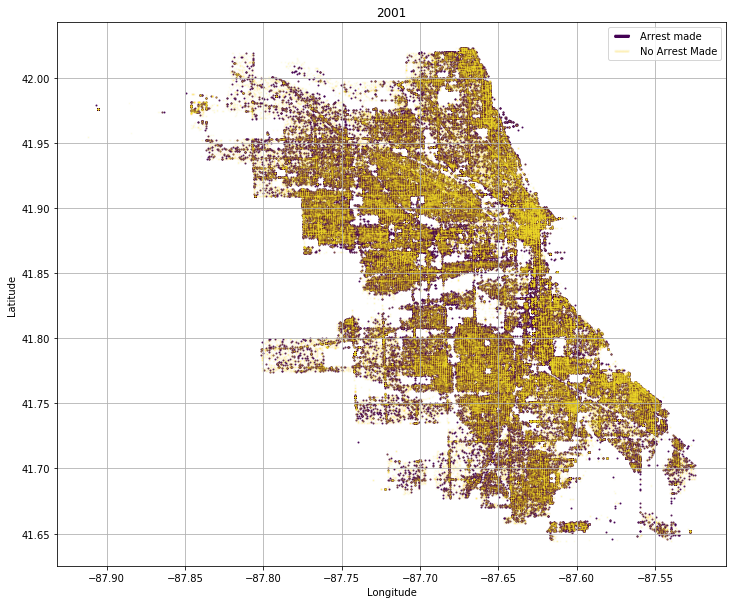

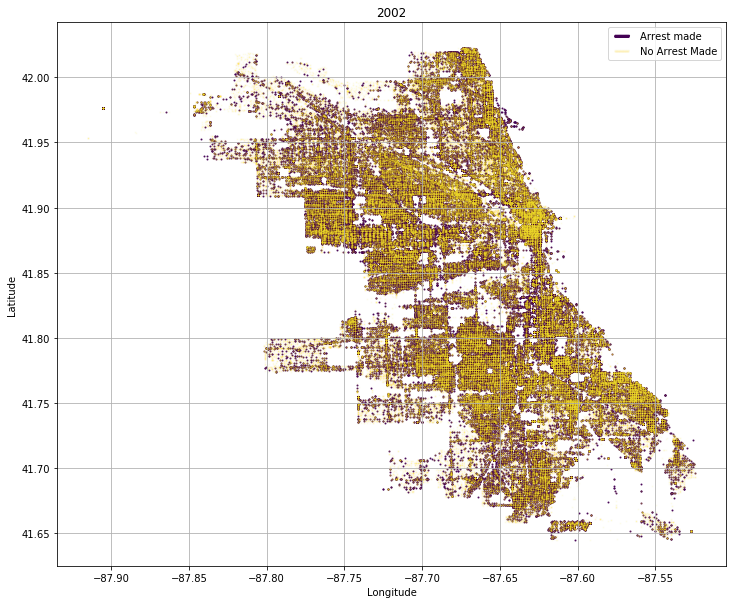

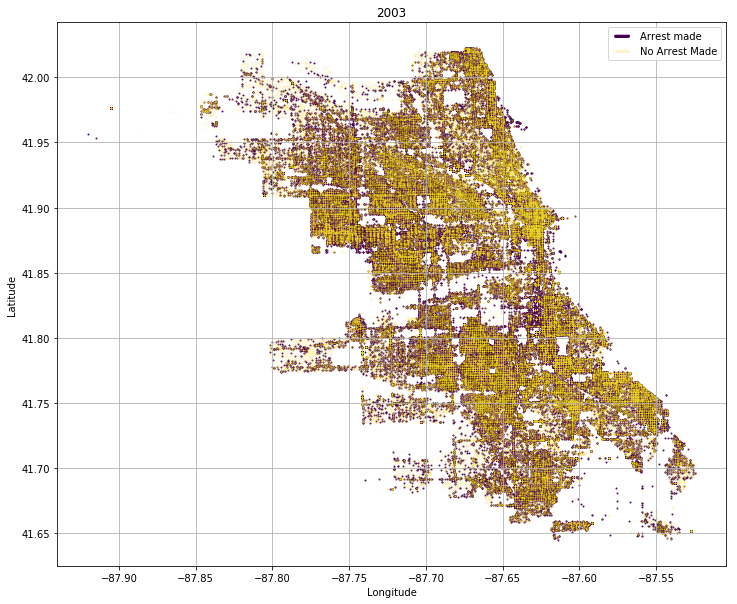

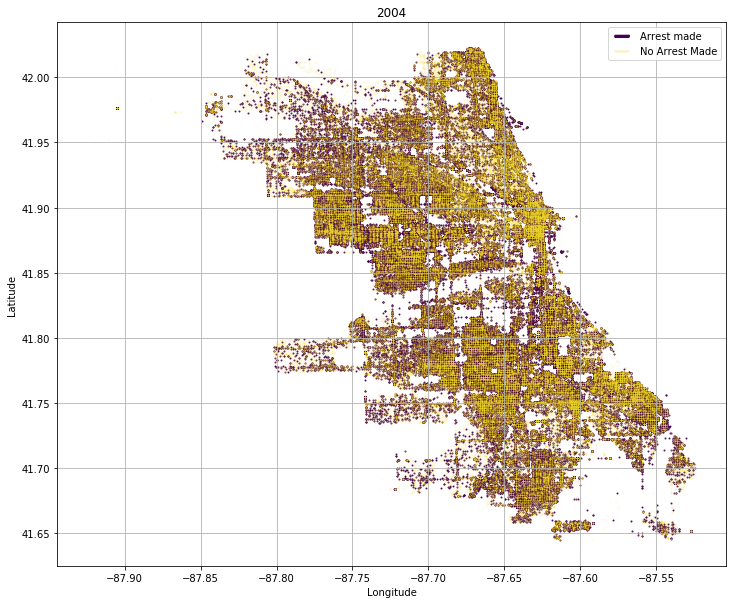

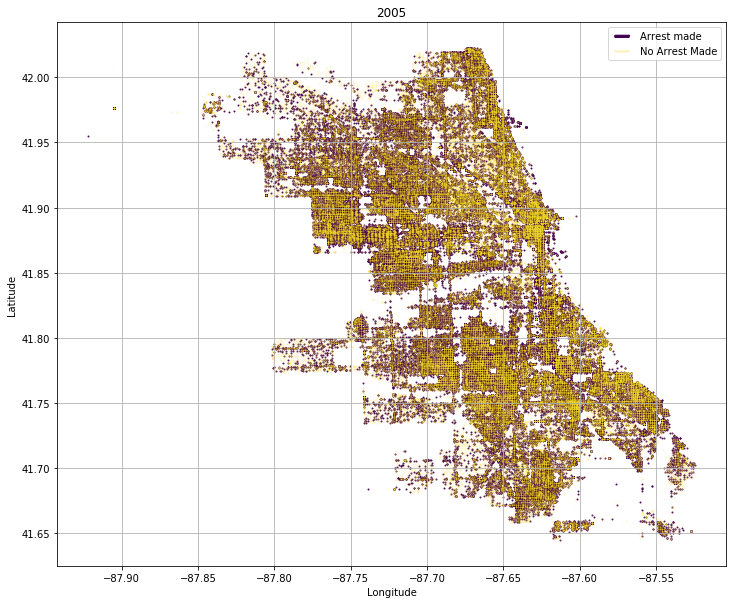

...

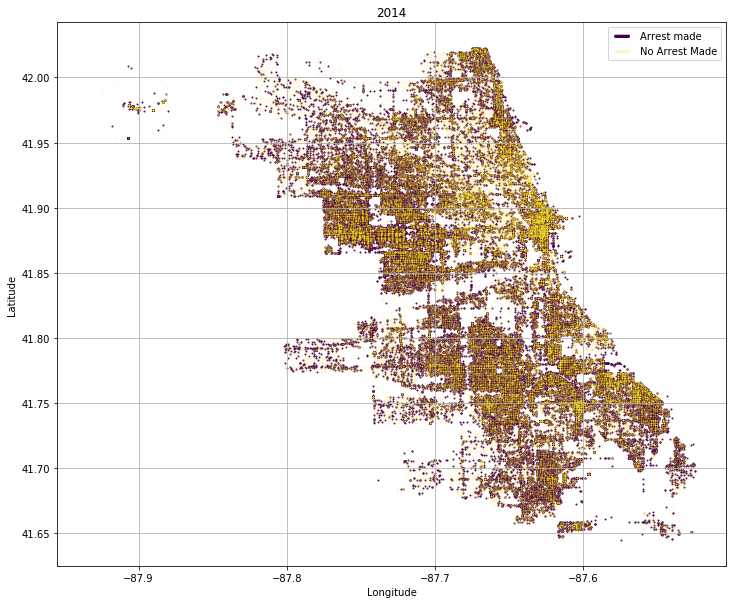

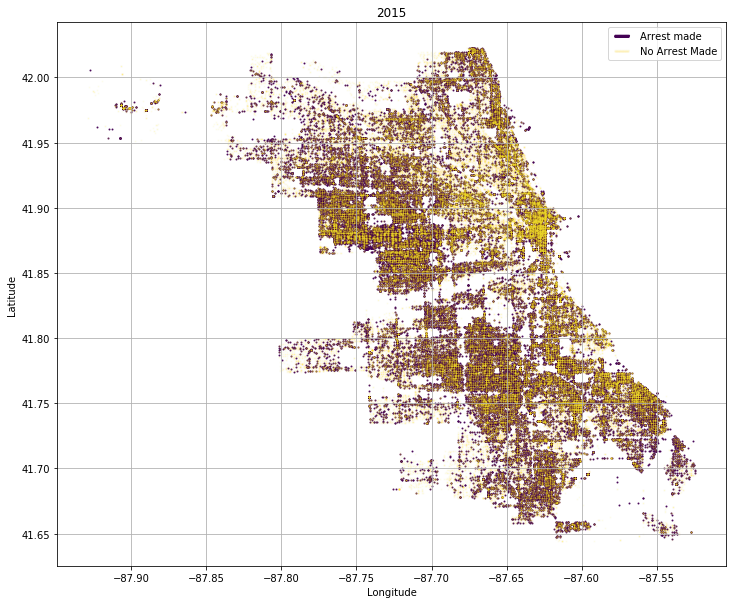

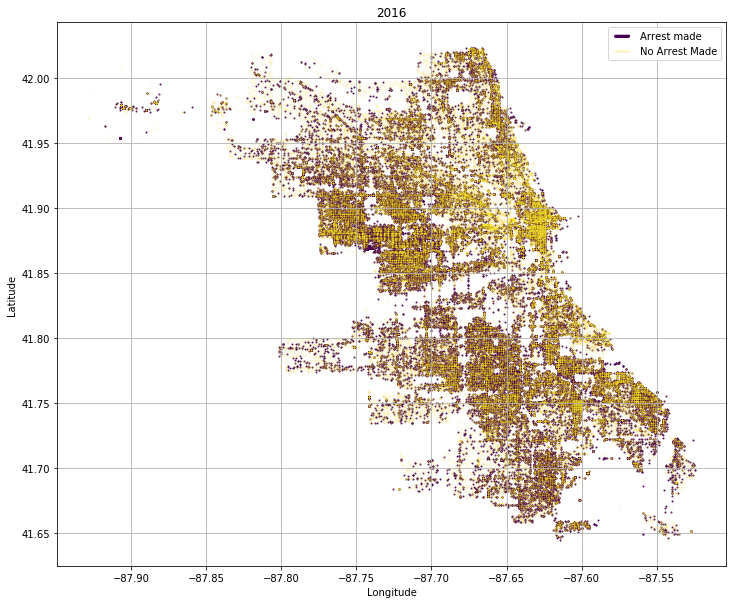

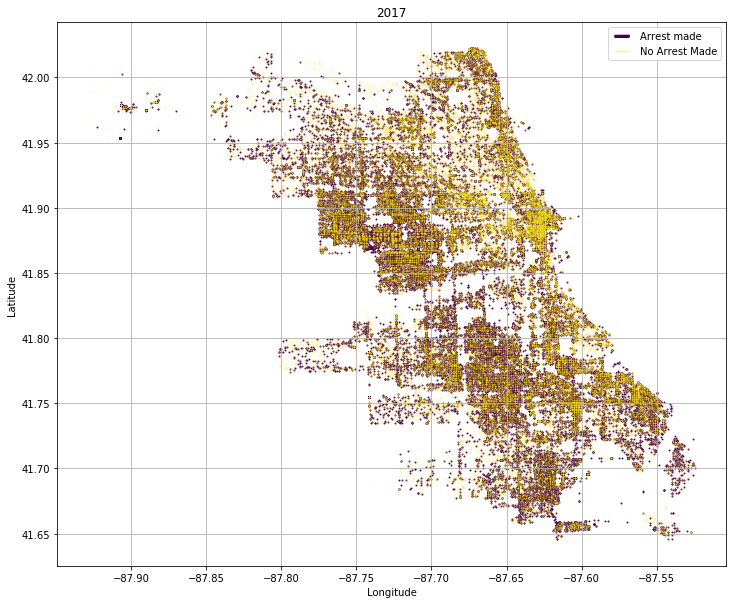

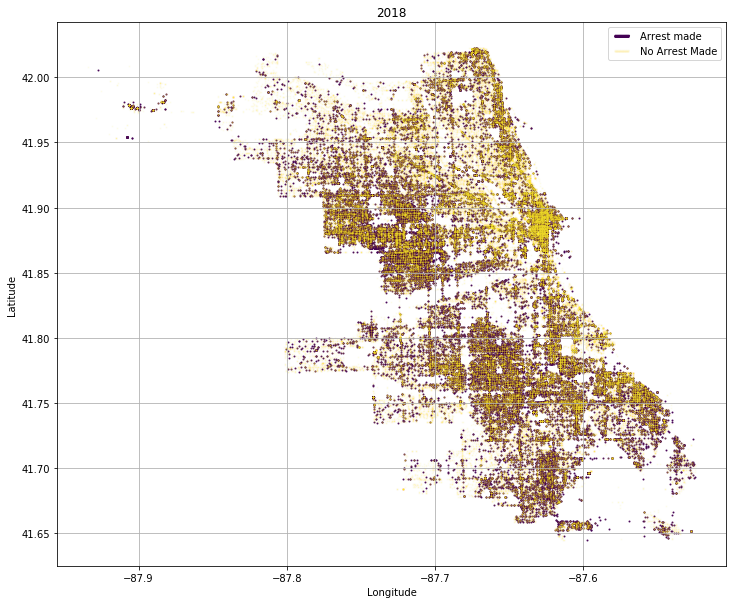

In [8]:
for year in range(2001,2019):
    data_year = data[data.Year == year]
    arrests = data_year[data_year.Arrest == True]
    non_arrests = data_year[data_year.Arrest == False]
    p1 = plt.scatter(arrests.Longitude, arrests.Latitude, c="#440154", s=1, alpha=.9)
    p2 = plt.scatter(non_arrests.Longitude, non_arrests.Latitude, c="#FDE726", s=1, alpha=.05)
    
    plt.xlabel('Longitude')
    plt.ylabel('Latitude')
    plt.title(year)
    plt.grid(True)
   
    plt.legend((p1,p2),("Arrest made", "No Arrest Made"), scatterpoints=50)

    plt.show()

## Question 2: How has the number of incidents changed over the year? 

Incidents have gone down over the years with the exception to 2016. I suspect it has something to do with Trumps inauguration. 

Arrests have also been about 25% of the total number of incidents over the years

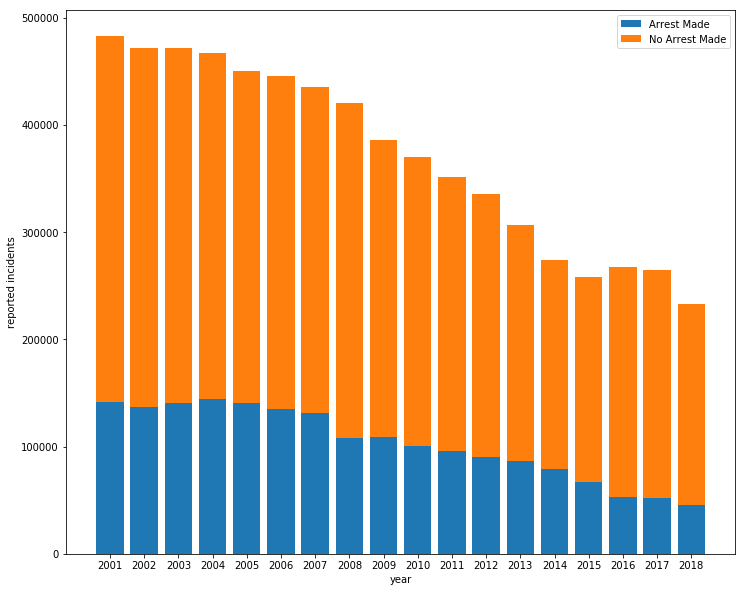

In [9]:
crime_rate = [len(data[data.Year == i]) for i in range(2001,2019)]
arrests = [len(data[(data.Year == year) & (data.Arrest == True)]) for year in range(2001,2019)]
non_arrests = [len(data[(data.Year == year) & (data.Arrest == False)]) for year in range(2001,2019)]

p1 = plt.bar(range(0,len(crime_rate)), arrests)
p2 = plt.bar(range(0,len(crime_rate)), non_arrests, bottom=arrests)
plt.xticks(range(0, len(crime_rate)), range(2001,2019))
plt.xlabel('year')
plt.ylabel('reported incidents')
plt.legend((p1,p2), ('Arrest Made', 'No Arrest Made'))

## Question 3: What crimes have been the most common over the years?
Theft was considently the top condender with Battery in second and Narcotics and Criminal Damage coming in 3rd and 4th until 2016 where Narcotics dropped and Assault took 4th place.

Text(0,0.5,'Number of Reports')

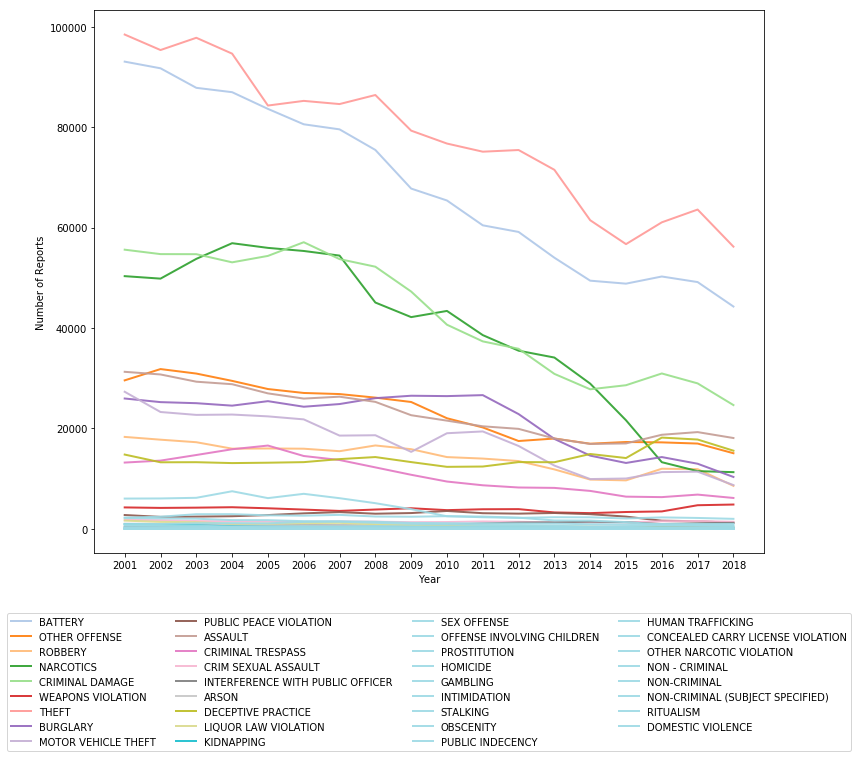

In [10]:
# Most common crimes by year 

# create a color palette
palette = plt.get_cmap('tab20')

# make dataframe
crimes = pd.unique(data['Primary Type'])
years = pd.unique(data['Year'])
years.sort()
dframe = pd.DataFrame(columns=crimes, index=years)
for year in years:
#     print(year)
    data_year = data[data['Year'] == year]
    for crime in crimes:
        dframe.at[year,crime] = data_year[data_year['Primary Type'] == crime].shape[0]
 
# print('making plot')
# multiple line plot
num=0
for column in dframe:
    num+=1
    plt.plot(dframe.index, dframe[column], marker='', color=palette(num), linewidth=2, alpha=0.9, label=column)
 
# Add legend
plt.legend(loc=9, bbox_to_anchor=(0.5, -0.1), ncol=4)
plt.xticks(range(2001,2019))

# Add titles
plt.xlabel("Year")
plt.ylabel("Number of Reports")


# Question 4: What district made the most arrests over the years?

Text(0,0.5,'Number of Reports')

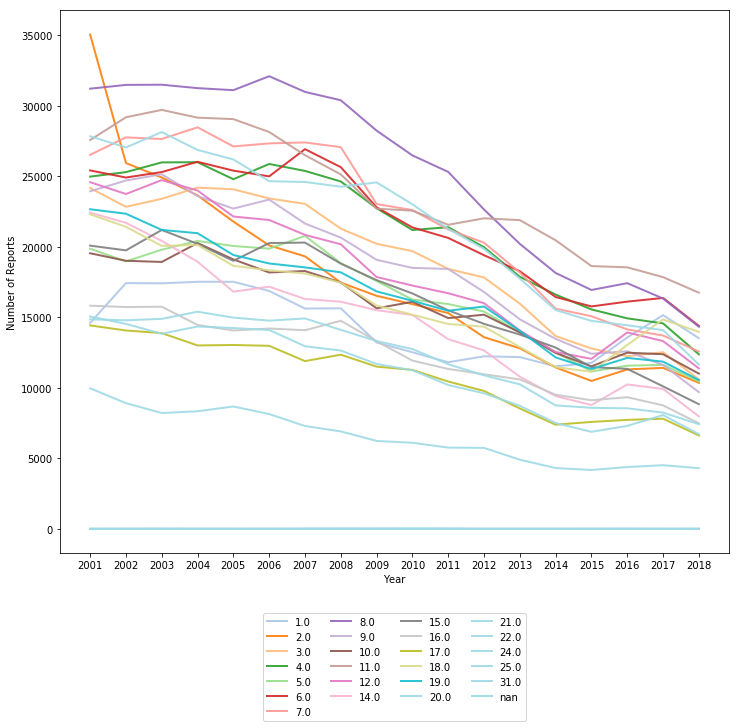

In [16]:

# create a color palette
palette = plt.get_cmap('tab20')

# make dataframe
districts = pd.unique(data['District'])
districts.sort()
years = pd.unique(data['Year'])
years.sort()
dframe = pd.DataFrame(columns=districts, index=years)
for year in years:
#     print(year)
    data_year = data[data['Year'] == year]
    for district in districts:
        dframe.at[year,district] = data_year[data_year['District'] == district].shape[0]
 
# print('making plot')
# multiple line plot
num=0
for column in dframe:
    num+=1
    plt.plot(dframe.index, dframe[column], marker='', color=palette(num), linewidth=2, alpha=0.9, label=column)
 
# Add legend
plt.legend(loc=9, bbox_to_anchor=(0.5, -0.1), ncol=4)
plt.xticks(range(2001,2019))

# Add titles
plt.xlabel("Year")
plt.ylabel("Number of Reports")


# A closer look at the location of arrests in individual districts 
**AGAIN, the graph is mis-leading with respect to the ratio of arrests to non-arrests**

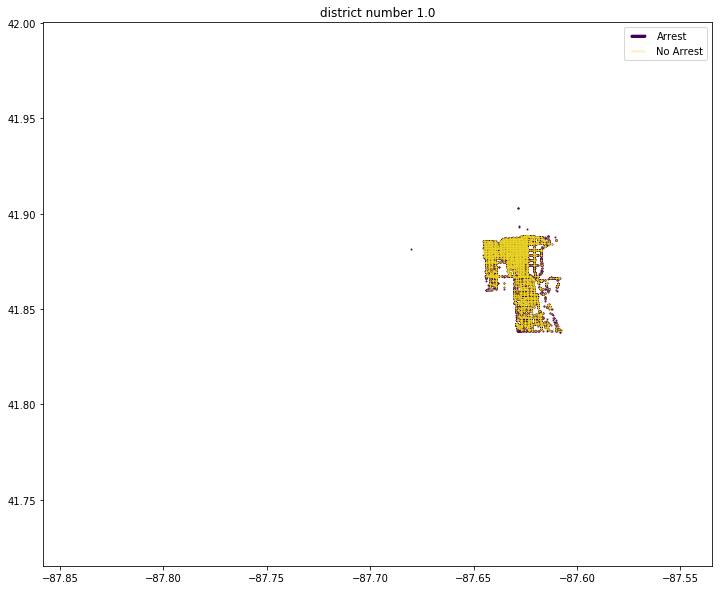

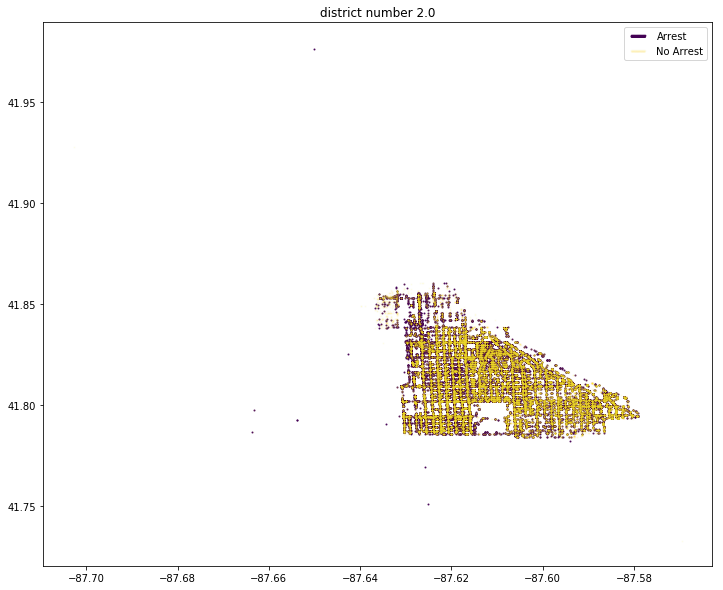

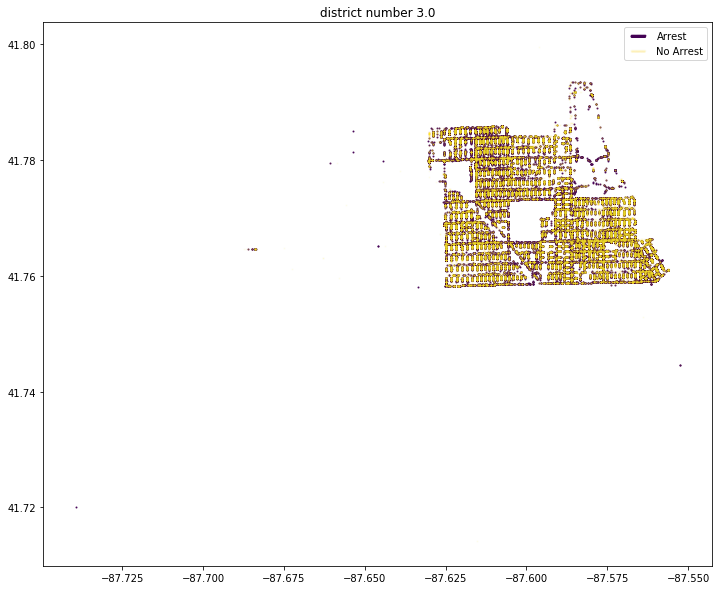

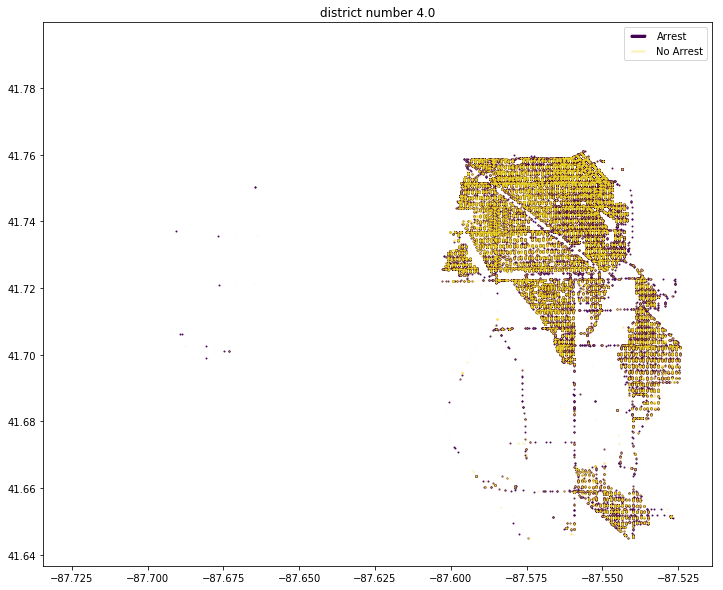

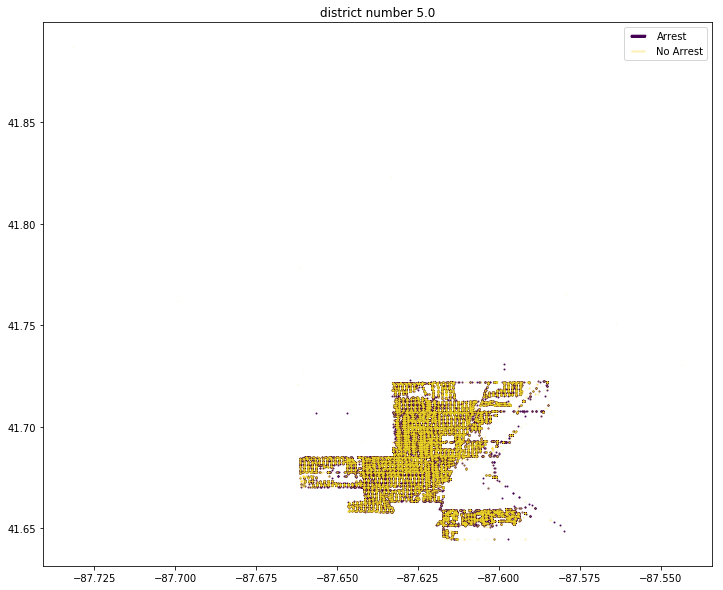

...

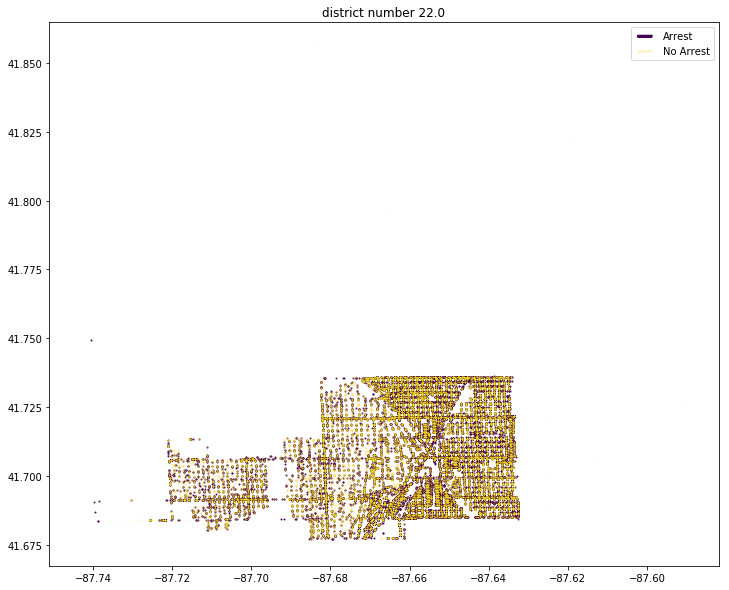

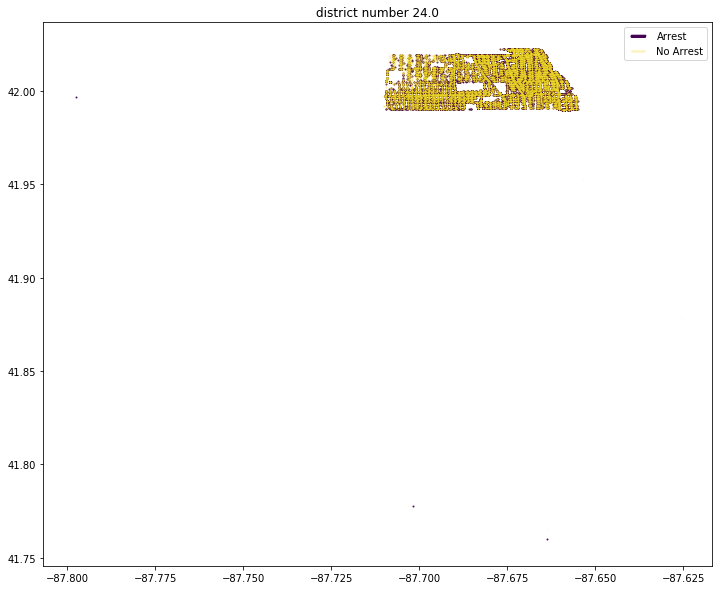

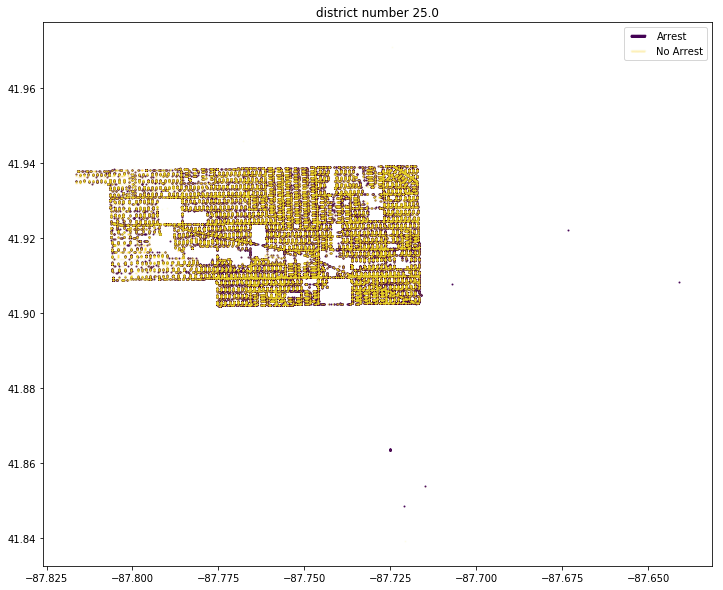

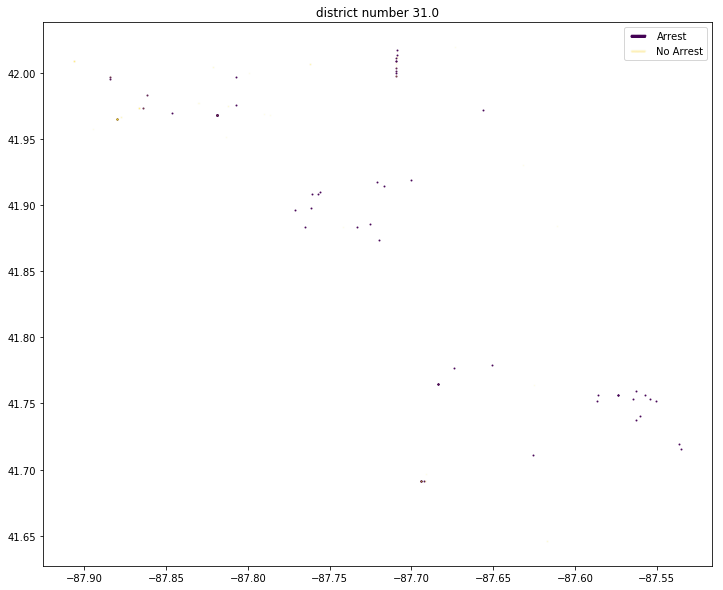

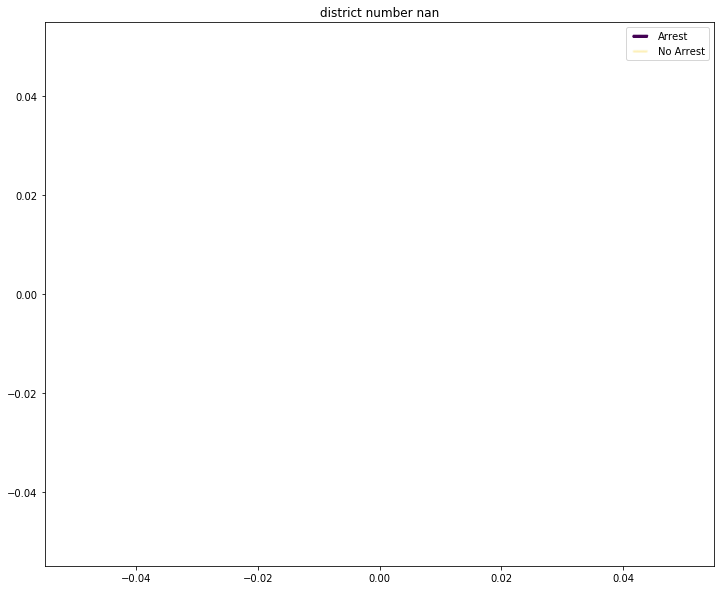

In [12]:
districts = data.District.unique()
districts.sort()
for district in districts:
    df = data[data.District == district]
    arrest = df[df.Arrest == True]
    non_arrest = df[df.Arrest == False]
    
    p1 = plt.scatter(arrest.Longitude, arrest.Latitude, c='#440154', s=1, alpha=.9)
    p2 = plt.scatter(non_arrest.Longitude, non_arrest.Latitude, c='#FDE726', s=1, alpha=.05)
    plt.title("district number %s" % district)
    
    plt.legend((p1,p2),("Arrest","No Arrest"), scatterpoints=50)
    
    plt.show()

# This graph just shows all the districts in relation to each other
I wonder where the most incidents happen?

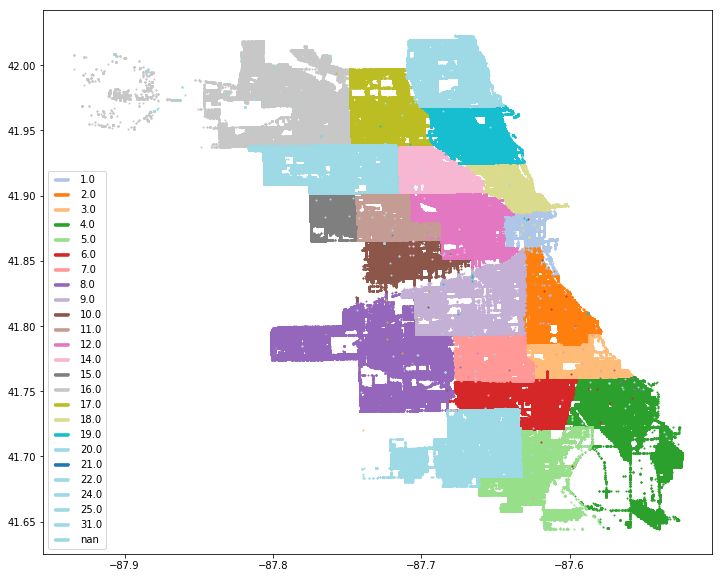

In [13]:
districts = data.District.unique()
districts.sort()
plots = []
# create a color palette
palette = plt.get_cmap('tab20')
num = 0
for district in districts:
    data_district = data[data.District == district]
    num+=1
    plots.append(plt.scatter(data_district.Longitude,data_district.Latitude, c=palette(num), s=1, label=district))

plt.legend(scatterpoints=50)

# This graph shows the density of incidents over the years

We can see that a relatively small amount of incidents were made in a couple of areas. Them being, the International Airport, and the Internation Golf course. Some other areas with little data are the river going through middle Chicago, and some public parks. 
A popular area seems to be the Navy Pier. 

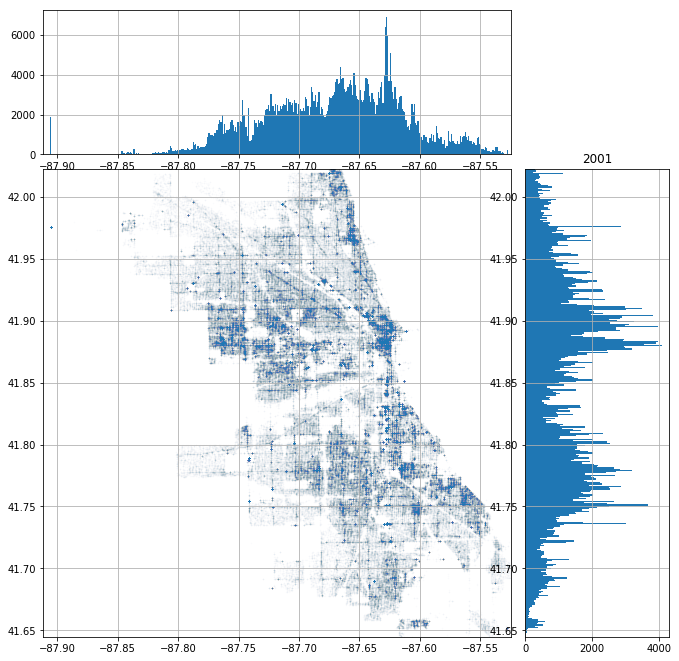

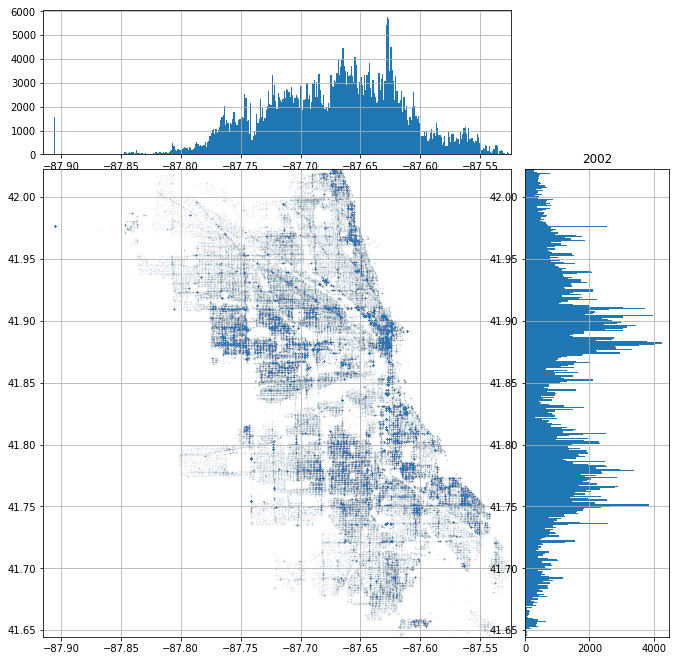

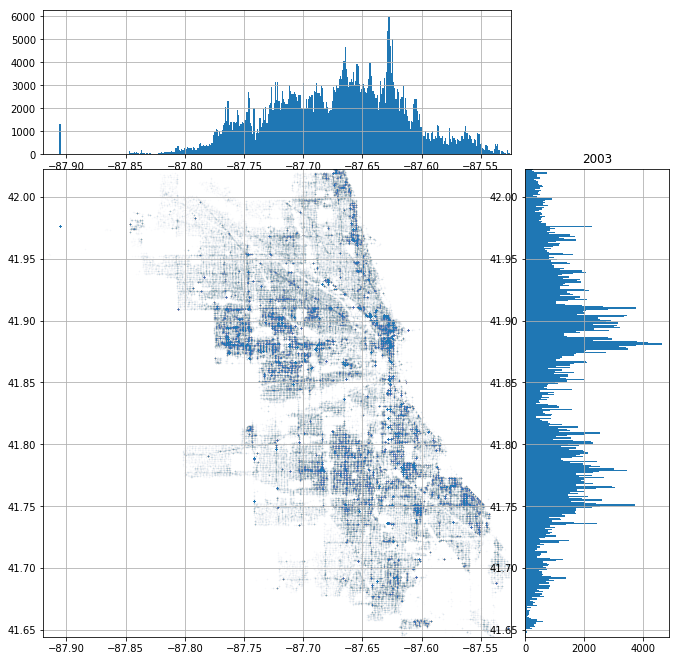

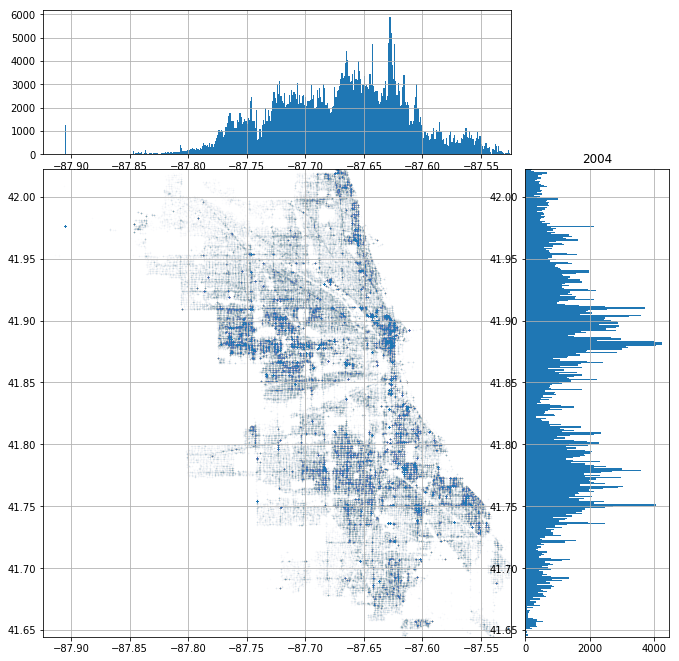

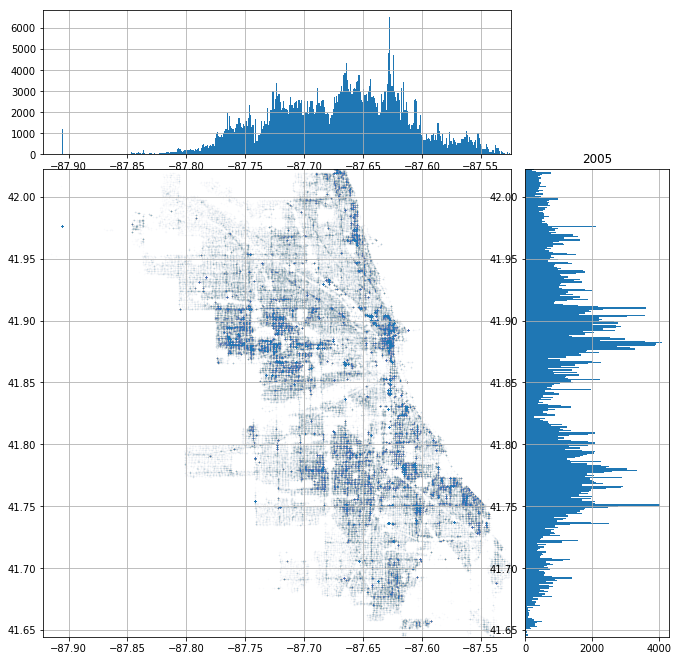

...

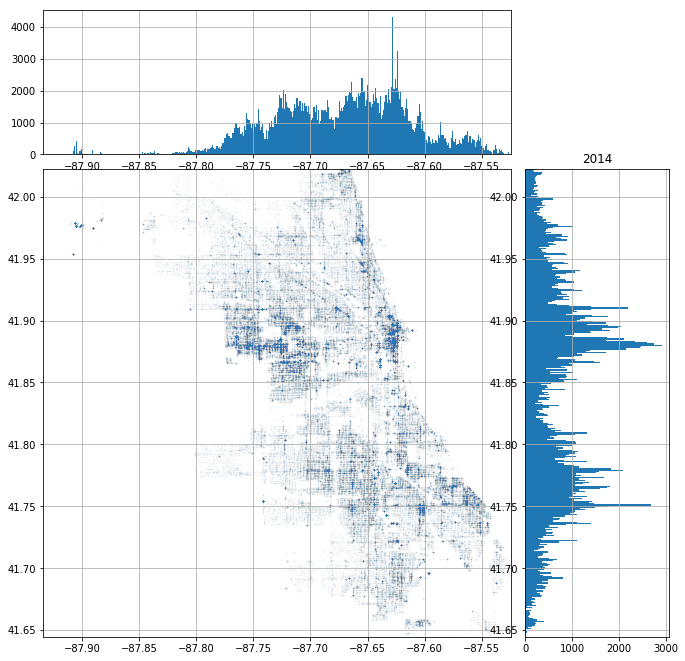

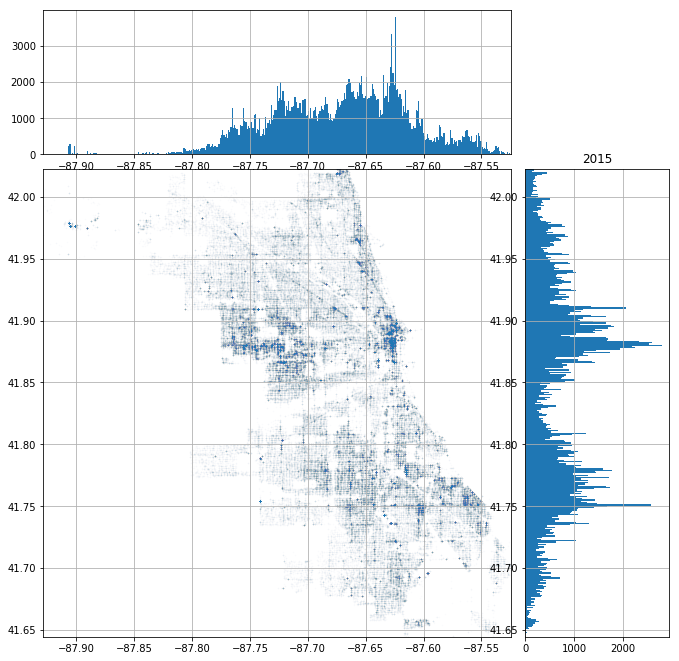

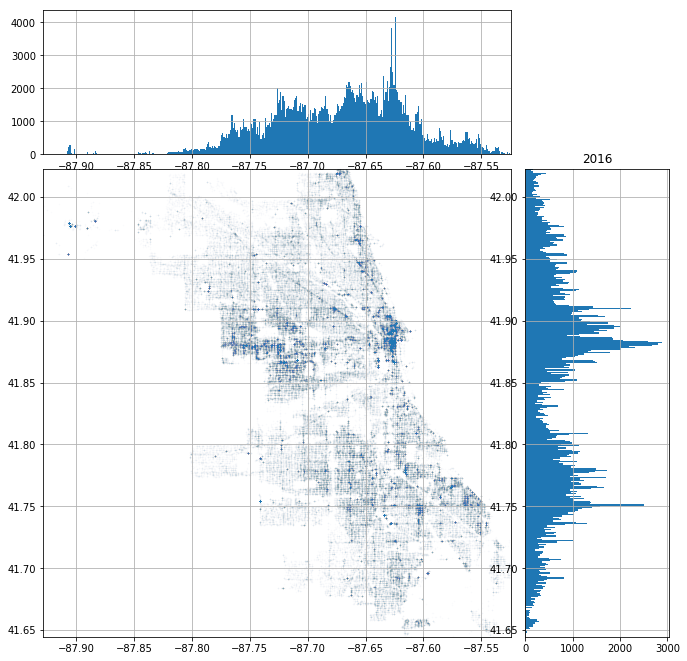

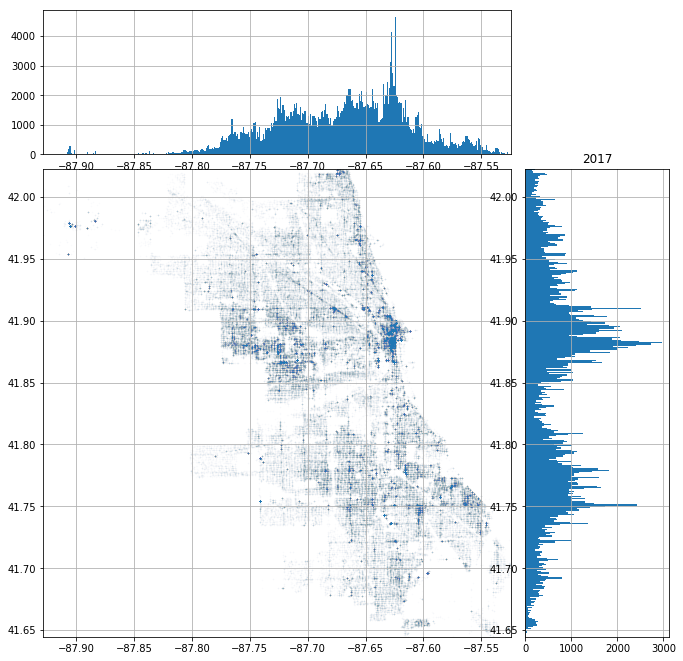

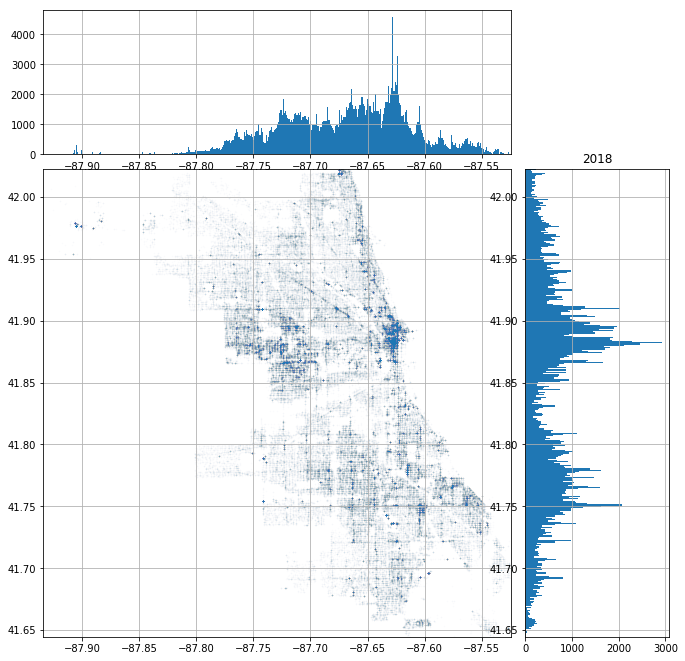

In [14]:

for year in range(2001,2019):
    data_year = data[data.Year == year]
    # get x and y
    x = data_year.Longitude
    y = data_year.Latitude

    # definitions for the axes
    left, width = 0.1, 0.65
    bottom, height = 0.1, 0.65
    bottom_h = left_h = left + width + 0.02

    rect_scatter = [left, bottom, width, height]
    rect_histx = [left, bottom_h, width, 0.2]
    rect_histy = [left_h, bottom, 0.2, height]

    # start with a rectangular Figure
    plt.figure(1, figsize=(10, 10))

    axScatter = plt.axes(rect_scatter)
    axHistx = plt.axes(rect_histx)
    axHisty = plt.axes(rect_histy)

    # the scatter plot:
    axScatter.scatter(x, y, s=1, alpha=.01)

    # now determine nice limits by hand:
    binwidth = .001

    x_min, x_max = np.min(x), np.max(x)
    y_min, y_max = np.min(y), np.max(y)

    axScatter.set_xlim((x_min, x_max))
    axScatter.set_ylim((y_min, y_max))

    x_bins = np.arange(x_min, x_max + binwidth, binwidth)
    y_bins = np.arange(y_min, y_max + binwidth, binwidth)

    axHistx.hist(x, bins=x_bins)
    axHisty.hist(y, bins=y_bins, orientation='horizontal')

    axHistx.set_xlim(axScatter.get_xlim())
    axHisty.set_ylim(axScatter.get_ylim())

    axScatter.grid(True)
    axHisty.grid(True)
    axHistx.grid(True)
    
    plt.title(year)

    plt.show()

# My last questions about the day had to do with the time of arrests and incidents. 

The least commond hour of day for an incident is 5am and the most common is around the time when people start leaving work. This doesn't come as a shock since the most common crimes were theft and battery.

In [21]:
time_format = '%m/%d/%Y %I:%M:%S %p'
times = pd.to_datetime(data['Date'], format=time_format)

In [22]:
times.head()

0   2015-03-18 19:44:00
1   2015-03-18 23:00:00
2   2015-03-18 22:45:00
3   2015-03-18 22:30:00
4   2015-03-18 21:00:00
Name: Date, dtype: datetime64[ns]

In [23]:
hour_buckets = [0 for i in range(24)]
for hour in times:
    hour_buckets[hour.hour] += 1

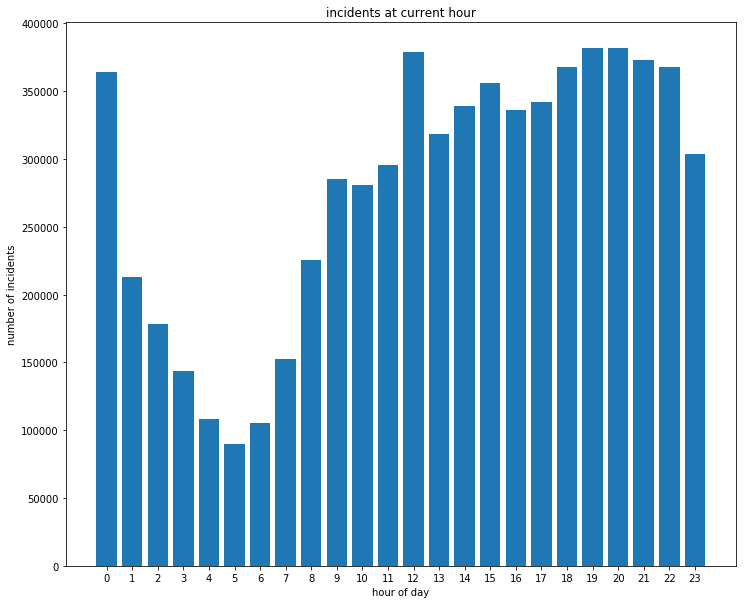

In [24]:
plt.bar(range(24),hour_buckets)
plt.title('incidents at current hour')
plt.ylabel("number of incidents")
plt.xlabel("hour of day")
plt.xticks(range(24))
plt.show()

# What about just arrests?

If we look at just arrests we can see a different graph. 5am is still the least common but now there is a dip in the old high. This could mean that more small incidents are occuring. I figure this is because people are driving home from work and getting pulled over.

In [28]:
arrests = data[data.Arrest == True]
arrest_times = pd.to_datetime(arrests['Date'], format=time_format)

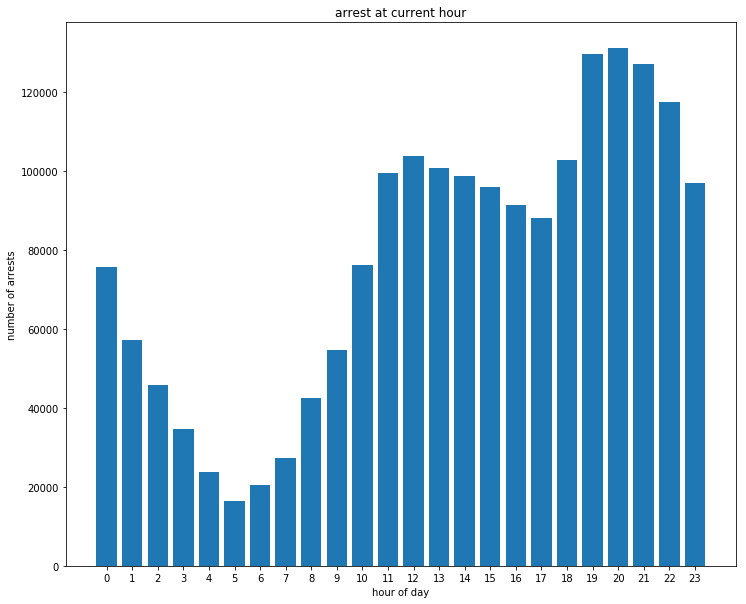

In [29]:
hour_buckets = [0 for i in range(24)]
for arrest_hour in arrest_times:
    hour_buckets[arrest_hour.hour] += 1
plt.bar(range(24),hour_buckets)
plt.title('arrest at current hour')
plt.ylabel("number of arrests")
plt.xlabel("hour of day")
plt.xticks(range(24))
plt.show()